<a href="https://colab.research.google.com/github/meichenfang/Poisson-regression/blob/main/demos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<font size="+4"><center> Demonstrations </center></font> 

# Load packages

In [154]:
%cd ../RADOM

# restrict numpy to use only one core, otherwise it will use all cores when doing @
import os
os.environ["BLAS_NUM_THREADS"] = "1" 
os.environ["OPENBLAS_NUM_THREADS"] = "1" # 


from inference import Trajectory
from plotting import *
from models.two_species import get_Y

/home/mffang/workspace/Poisson-regression/RADOM


In [163]:
import numpy as np
import pickle
from tqdm import tqdm
import matplotlib.pyplot as plt
from scipy import stats
import copy
plt.rcParams['font.size'] = '18'
label_font = '48'

In [164]:
%cd ../notebooks
results_dir = 'benchmarks_results/'

/home/mffang/workspace/Poisson-regression/notebooks


# A simple case

We rescale the time by average half lives of mRNA

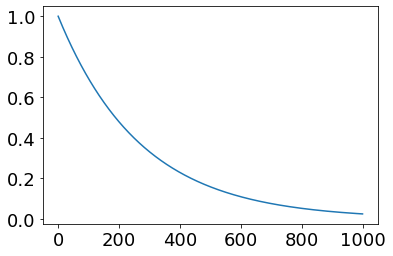

In [222]:
plt.plot(np.exp(-np.exp(-1)*np.linspace(0,10,1000)));

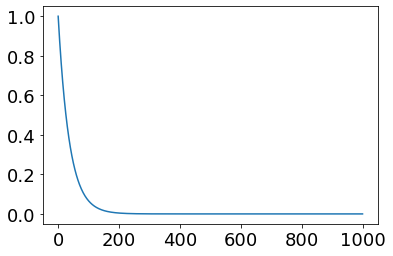

In [223]:
plt.plot(np.exp(-np.exp(1)*np.linspace(0,10,1000)));

In [224]:
def simulate_data(topo, tau, n, p, loga_max=4, logb_max=1, random_seed=42):
    np.random.seed(random_seed)
    L=len(topo)
    n_states=len(set(topo.flatten()))
    t=np.linspace(tau[0],tau[-1],n)
    true_t = []
    
    theta=np.zeros((p,n_states+4))
    for j in range(n_states+2):
        theta[:,j]=np.exp(np.random.uniform(0,loga_max,size=p))-1+1e-3
    theta[:,-2:]=np.exp(np.random.uniform(-logb_max,logb_max,size=(p,2)))
    
    Y = np.zeros((n*L,p,2))
    for l in range(L):
        theta_l = np.concatenate((theta[:,topo[l]], theta[:,-4:]), axis=1)
        Y[l*n:(l+1)*n] = get_Y(theta_l,t,tau) # m*p*2
        true_t = np.append(true_t,t)

    X = np.random.poisson(Y)
    return theta, true_t, Y, X,

In [225]:
def simulate_data_null(topo, tau, n, true_p, null_p, loga_max=4, logb_max=1, random_seed=42):
    np.random.seed(random_seed)
    L=len(topo)
    n_states=len(set(topo.flatten()))
    t=np.linspace(tau[0],tau[-1],n)
    true_t = []
    p = true_p + null_p
    
    theta=np.zeros((p,n_states+4))
    for j in range(n_states+2):
        theta[:,j]=np.exp(np.random.uniform(0,loga_max,size=p))-1+1e-3
    theta[:,-2:]=np.exp(np.random.uniform(-logb_max,logb_max,size=(p,2)))
    
    for j in range(n_states):
        theta[true_p:,j]=theta[true_p:,n_states]
    theta[true_p:,-2] = 1
    theta[true_p:,-1] = theta[true_p:,-4]/theta[true_p:,-3]
    
    Y = np.zeros((n*L,p,2))
    for l in range(L):
        theta_l = np.concatenate((theta[:,topo[l]], theta[:,-4:]), axis=1)
        Y[l*n:(l+1)*n] = get_Y(theta_l,t,tau) # m*p*2
        true_t = np.append(true_t,t)

    X = np.random.poisson(Y)
    return theta, true_t, Y, X,

In [226]:
#%% generate data
n=1000
p=100
topo = np.array([[0,]])
tau = (0,10)
true_theta, t, Y, X = simulate_data(topo,tau,n=n,p=p,random_seed=2022)
#true_theta, t, Y, X = simulate_data_null(topo,tau,n=2000,true_p=50,null_p=50,random_seed=2023)

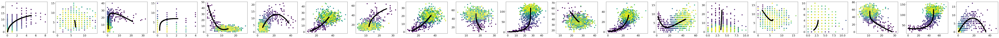

In [227]:
t = np.linspace(tau[0],tau[-1],n)
p = 20
fig, ax = plt.subplots(1,p,figsize=(6*p,4))
for i in range(p):
    #ax[i].plot(Y[:,i,1]*gamma[i],Y[:,i,1],'--', color='gray');
    ax[i].scatter(X[:,i,0],X[:,i,1],c=t);
    ax[i].scatter(Y[:,i,0],Y[:,i,1],c='black');
# time increases from blue to red

## Unrestricted

In [228]:
traj = Trajectory(topo, tau, verbose=1)
res = traj.fit_multi_init(X,100,n_init=3,epoch=10,parallel=True,n_threads=10)

trial 1


100%|██████████| 10/10 [00:04<00:00,  2.23it/s]

trial 2



100%|██████████| 10/10 [00:04<00:00,  2.04it/s]

trial 3



100%|██████████| 10/10 [00:04<00:00,  2.15it/s]


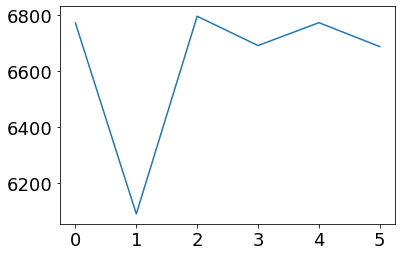

In [229]:
plt.plot(res[1]);

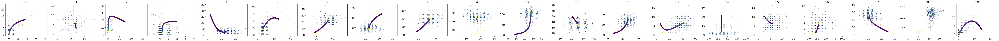

In [230]:
plot_phase(traj,idx=np.arange(20))

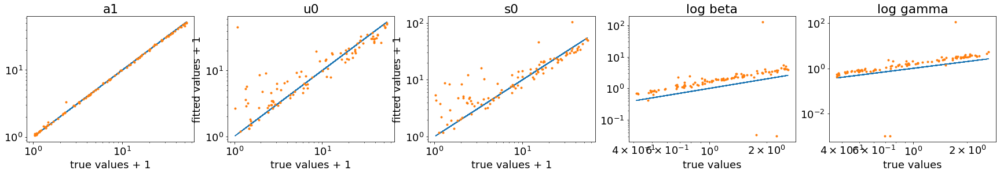

In [231]:
plot_theta(true_theta,traj.theta)

trial 1


 71%|███████   | 71/100 [00:30<00:12,  2.36it/s]

trial 2



 48%|████▊     | 48/100 [00:18<00:20,  2.58it/s]

trial 3



 27%|██▋       | 27/100 [00:11<00:29,  2.43it/s]


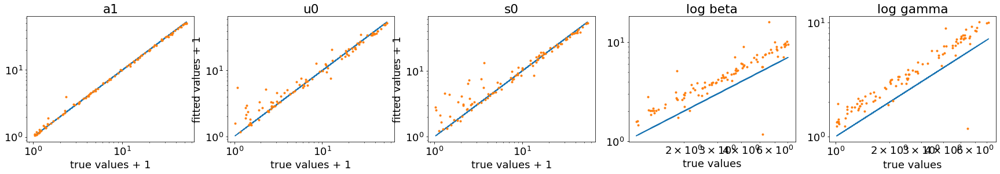

In [209]:
traj = Trajectory(topo, tau, verbose=1)
res = traj.fit_multi_init(X,m=100,n_init=3,epoch=100,parallel=True,n_threads=10)
plot_theta(true_theta,traj.theta)

trial 1


100%|██████████| 10/10 [00:09<00:00,  1.10it/s]

trial 2



100%|██████████| 10/10 [00:08<00:00,  1.22it/s]

trial 3



100%|██████████| 10/10 [00:09<00:00,  1.11it/s]


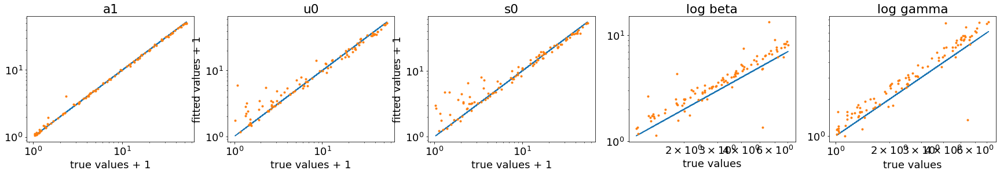

In [210]:
traj = Trajectory(topo, tau, verbose=1)
res = traj.fit_multi_init(X,m=1000,n_init=3,epoch=10,parallel=True,n_threads=10)
plot_theta(true_theta,traj.theta)

trial 1


 82%|████████▏ | 82/100 [01:09<00:15,  1.18it/s]

trial 2



100%|██████████| 100/100 [01:27<00:00,  1.14it/s]

trial 3



 77%|███████▋  | 77/100 [01:09<00:20,  1.11it/s]


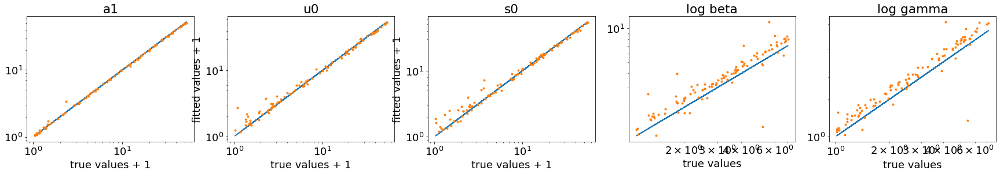

In [211]:
traj = Trajectory(topo, tau, verbose=1)
res = traj.fit_multi_init(X,m=1000,n_init=3,epoch=100,parallel=True,n_threads=10)
plot_theta(true_theta,traj.theta)

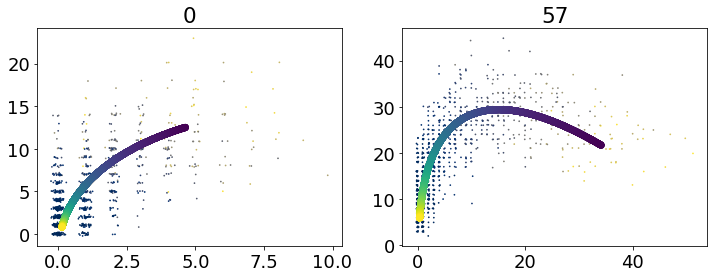

In [197]:
err = np.abs(traj.theta-true_theta)/true_theta
idx = np.arange(100)[err[:,0]>1]
plot_phase(traj,idx=idx)

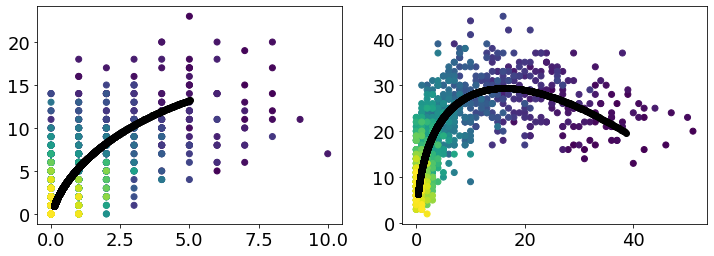

In [198]:
t = np.linspace(0,1,n)
fig, ax = plt.subplots(1,len(idx),figsize=(6*len(idx),4))
for i,j in enumerate(idx):
    #ax[i].plot(Y[:,i,1]*gamma[i],Y[:,i,1],'--', color='gray');
    ax[i].scatter(X[:,j,0],X[:,j,1],c=t);
    ax[i].scatter(Y[:,j,0],Y[:,j,1],c='black');

## check AIC

In [28]:
AIC = -traj.compute_AIC(X)/2/n

$$E = E_y E_x \mathcal{L}(\hat\theta(y),x)$$
$$ AIC = \mathcal{L}(\hat\theta(y),y) - K$$
$$E_y AIC = E$$

In [ ]:
traj_ = copy.deepcopy(traj)
traj_.verbose=0
KK = 1000
E_x_L_theta_hat_y = np.zeros(KK)
AICs = np.zeros(KK)
for ii in range(KK):
    X_Y = np.random.poisson(Y)
    ## fit theta_hat_y
    traj_.fit(X_Y,theta=traj.theta)
    AICs[ii]=-traj_.compute_AIC(X_Y)/2/n
    L_theta_hat_y = []
    for jj in range(KK):
        X_X = np.random.poisson(Y)
        L_theta_hat_y.append(traj_.compute_lower_bound(X_X))
        
    E_x_L_theta_hat_y[ii] = np.mean(L_theta_hat_y)
    
E = np.mean(E_x_L_theta_hat_y)
E_AIC = np.mean(AICs)

702.2606138798809 702.2781883170303


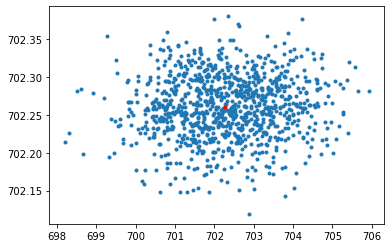

In [34]:
print(E, E_AIC)
plt.plot(AICs,E_x_L_theta_hat_y,'.');
plt.plot(E_AIC,E,'r.');

## Restricted

In [7]:
traj_r = Trajectory(topo, tau, restrictions={4:[[0],[-4]]},verbose=1)
Q_r, _ = traj_r.fit_multi_init(X,100,n_init=3,epoch=20,parallel=True,n_threads=4)

trial 1


100%|██████████| 20/20 [00:07<00:00,  2.57it/s]

trial 2



 55%|█████▌    | 11/20 [00:04<00:03,  2.45it/s]

trial 3



 50%|█████     | 10/20 [00:04<00:04,  2.30it/s]


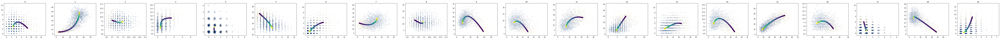

In [9]:
plot_phase(traj_r,idx=np.arange(20))

In [ ]:
traj_ = copy.deepcopy(traj_r)
traj_.verbose=0
KK = 100
E_x_L_theta_hat_y = np.zeros(KK)
AICs = np.zeros(KK)
for ii in range(KK):
    X_Y = np.random.poisson(Y)
    ## fit theta_hat_y
    traj_.fit(X_Y,theta=traj_r.theta)
    AICs[ii]=-traj_.compute_AIC(X_Y)/2/n
    L_theta_hat_y = []
    for jj in range(KK):
        X_X = np.random.poisson(Y)
        L_theta_hat_y.append(traj_.compute_lower_bound(X_X))
        
    E_x_L_theta_hat_y[ii] = np.mean(L_theta_hat_y)
    
E = np.mean(E_x_L_theta_hat_y)
E_AIC = np.mean(AICs)

702.4608150333157 702.2728145914439


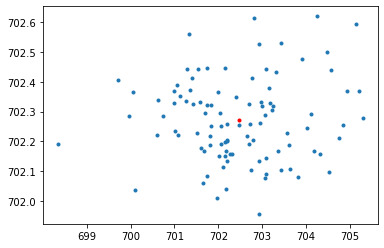

In [54]:
print(E_AIC, E)
plt.plot(AICs,E_x_L_theta_hat_y,'.');
plt.plot(E_AIC,E,'r.');

In [20]:
-traj_r.compute_AIC(X)/2/n

700.4390978030564

In [31]:
BIC = traj_r.compute_lower_bound(X) - traj_r.k*np.log(n)/n
BIC

700.112353131309

In [32]:
BIC = traj.compute_lower_bound(X) - traj.k*np.log(n)/n
BIC

700.1105339390238

## One species

In [18]:
traj = Trajectory(topo, tau, model="one_species")
res = traj.fit_multi_init(X.sum(axis=-1,keepdims=True),100,n_init=3,epoch=10,parallel=True,n_threads=2)

trial 1


100%|██████████| 10/10 [00:01<00:00,  8.86it/s]

trial 2



100%|██████████| 10/10 [00:00<00:00, 10.36it/s]
/home/mffang/workspace/Poisson-regression/RADOM/inference.py:395: RuntimeWarning: invalid value encountered in log
  config += np.exp( np.sum(np.log(np.arange(1,self.K+1)+theta_mean[self.topo[l]]))) * theta_mean[self.n_states]
100%|██████████| 10/10 [00:01<00:00,  8.99it/s]

trial 3



100%|██████████| 10/10 [00:01<00:00,  9.69it/s]


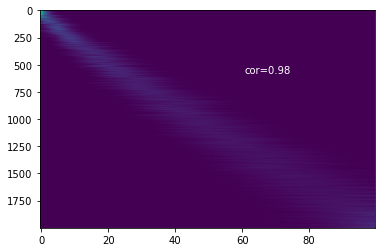

In [19]:
Q, elbos = res
plot_t(Q,t=t)

# Vary p, n and topo

## Functions

In [8]:
def fit_vary_n(topo, tau, ns=[100,500,1000,2000,5000,10000], p=100, seeds = np.arange(20), n_init=3, cores=10):
    K = len(set(topo.flatten()))
    L = len(topo)
    results = []
    fig, axs = plt.subplots(len(ns), 10, figsize=(6*10,4*len(ns)))
    for i,n in enumerate(ns):   
        print(n)
        for k,seed in tqdm(enumerate(seeds)):
            theta, true_t, Y, X = simulate_data(topo,tau,n,p,random_seed=seed)
            traj = Trajectory(topo, tau)
            Q, elbos = traj.fit_multi_init(X,100,n_init=n_init,epoch=10,parallel=True,n_threads=cores)   
            results.append((theta, traj, Q, X))
            if k>=10:
                continue
            else:
                plot_t(Q, 0, ax=axs[i,k], t=true_t)
    return results

In [9]:
def fit_vary_p(topo, tau, n=2000, ps=[10,50,100,500,1000,2000], seeds = np.arange(20), n_init=3, cores=40):
    K = len(set(topo.flatten()))
    L = len(topo)
    results = []
    fig, axs = plt.subplots(len(ps), 10, figsize=(60,4*len(ps)) )
    for i,p in enumerate(ps): 
        print(p)
        for k,seed in tqdm(enumerate(seeds)):
            theta, true_t, Y, X = simulate_data(topo,tau,n,p,random_seed=seed)
            traj = Trajectory(topo, tau)
            Q, elbos = traj.fit_multi_init(X,100,n_init=n_init,epoch=10,parallel=True,n_threads=min(cores,max(2,int(p/50)))) 
            results.append((theta, traj, Q, X))
            if k>=10:
                continue
            else:
                plot_t(Q, 0, ax=axs[i,k], t=true_t)
    return results

In [10]:
def fit_vary_null_p(topo, tau, n=2000, true_p=100, null_ps=[10,50,100,200,500], seeds = np.arange(20), n_init=3, cores=40):
    K = len(set(topo.flatten()))
    L = len(topo)
    results = []
    fig, axs = plt.subplots(len(null_ps), 10, figsize=(60,4*len(null_ps)) )
    for i,null_p in enumerate(null_ps): 
        print(null_p)
        p=true_p+null_p
        for k,seed in enumerate(seeds):
            theta, true_t, Y, X = simulate_data_null(topo,tau,n,true_p,null_p,random_seed=seed)
            traj = Trajectory(topo, tau)
            Q, elbos = traj.fit_multi_init(X,100,n_init=n_init,epoch=10,parallel=True,n_threads=min(cores,max(2,int(p/50)))) 
            results.append((theta, traj, Q, X))
            if k>=10:
                continue
            else:
                plot_t(Q, 0, ax=axs[i,k], t=true_t)
    return results

### Fixed parameters

In [90]:
def fit_vary_n_fixed(topo, tau, ns=[100,316,1000,3162,10000], p=100, seed=2022, K=10, n_init=3, epoch=10, m=100, cores=10):
    np.random.seed(seed)
    L = len(topo)     
    n_states=len(set(topo.flatten()))
    loga_max = 4
    logb_max = 2
    theta=np.zeros((p,n_states+4))
    for j in range(n_states+2):
        theta[:,j]=np.exp(np.random.uniform(0,loga_max,size=p))-1+1e-3
    theta[:,-2]=np.exp(np.random.uniform(0,logb_max,size=p))
    theta[:,-1]=np.exp(np.random.uniform(0,logb_max,size=p))
    
    results = []
    fig, axs = plt.subplots(len(ns), 10, figsize=(6*10,4*len(ns)))
    for i,n in enumerate(ns):   
        print(n,"cells per lineage")
        threads = cores
        if n >= 10000:
            threads *= 2 
          
        for k in tqdm(range(K)):
            np.random.seed(k)
            true_t = []
            Y = np.zeros((n*L,p,2)) 
            for l in range(L):
                #t = np.sort(np.random.uniform(tau[0],tau[-1],n))
                t = np.linspace(tau[0],tau[-1],n)
                theta_l = np.concatenate((theta[:,topo[l]], theta[:,-4:]), axis=1)
                Y[l*n:(l+1)*n] = get_Y(theta_l,t,tau) # m*p*2
                true_t = np.append(true_t,t)
        
            X = np.random.poisson(Y)
            traj = Trajectory(topo, tau)
            Q, elbos = traj.fit_multi_init(X,m,n_init=n_init,epoch=epoch,parallel=True,n_threads=threads)  
            
            traj.true_t = true_t
            traj.true_theta = theta
            
            results.append(traj)
            if k>=10:
                continue
            else:
                plot_t(Q, 0, ax=axs[i,k], t=true_t)
    
    return results

In [50]:
def fit_vary_p_fixed(topo, tau, n=2000, ps=[10,31,100,316,1000], seed=2022, K=10, n_init=3, epoch=10, m=100, cores=10):
    np.random.seed(seed)
    L = len(topo)     
    n_states=len(set(topo.flatten()))
    loga_max = 4
    logb_max = 2
    p_total = int( np.max(ps) )
    theta_all=np.ones((p_total,n_states+4))
    
    ## theta
    for j in range(n_states+2):
        theta_all[:,j]=np.exp(np.random.uniform(0,loga_max,size=p_total))-1+1e-3
    theta_all[:,-2]=np.exp(np.random.uniform(0,logb_max,size=p_total))
    theta_all[:,-1]=np.exp(np.random.uniform(0,logb_max,size=p_total))
    
    results = []
    fig, axs = plt.subplots(len(ps), 10, figsize=(6*10,4*len(ps)))
    for i,p in enumerate(ps):   
        print(p,"genes")
        threads = cores
        Y = np.zeros((n*L,p,2))
        theta = theta_all[:p]
        
        for k in tqdm(range(K)):
            np.random.seed(k)
            true_t = []
            for l in range(L):
                #t=np.linspace(tau[0],tau[-1],n)
                t = np.sort(np.random.uniform(tau[0],tau[-1],n))
                theta_l = np.concatenate((theta[:,topo[l]], theta[:,-4:]), axis=1)
                Y[l*n:(l+1)*n] = get_Y(theta_l,t,tau) # m*p*2
                true_t = np.append(true_t,t)
        
            X = np.random.poisson(Y)
            traj = Trajectory(topo, tau)
            Q, elbos = traj.fit_multi_init(X,m=m,n_init=n_init,epoch=epoch,parallel=True,n_threads=threads) 
            
            traj.true_t = true_t
            traj.true_theta = theta
            
            results.append(traj)
            if k>=10:
                continue
            else:
                plot_t(Q, 0, ax=axs[i,k], t=true_t)
                
    return results

In [31]:
def fit_vary_null_p_fixed(topo, tau, n=2000, true_p=100, null_ps=[10,31,100,316], seeds = np.arange(20), n_init=3, epoch=10, m=100, cores=10):
    np.random.seed(42)
    K = len(set(topo.flatten()))
    L = len(topo)     
    n_states=len(set(topo.flatten()))
    loga_max = 4
    logb_max = 2
    p_total = int( true_p + np.max(null_ps) )
    theta=np.ones((p_total,n_states+4))
    
    ## true_p
    for j in range(n_states+2):
        theta[:true_p,j]=np.exp(np.random.uniform(0,loga_max,size=true_p))-1+1e-3
    theta[:true_p,-2]=np.exp(np.random.uniform(0,logb_max,size=true_p))
    theta[:true_p,-1]=np.exp(np.random.uniform(0,logb_max,size=true_p))
    
    ## null_p
    theta[true_p:,:n_states+1]=(np.exp(np.random.uniform(0,loga_max,size=np.max(null_ps)))-1+1e-3)[:,None]
    theta[true_p:,n_states+1]=np.exp(np.random.uniform(0,logb_max,size=np.max(null_ps)))-1+1e-3
    theta[true_p:,-1] = theta[true_p:,-4]/theta[true_p:,-3]

    results = []
    fig, axs = plt.subplots(len(null_ps), 20, figsize=(6*20,4*len(null_ps)))
    for i,null_p in enumerate(null_ps):   
        print(null_p,"null genes")
        p = true_p + null_p
        threads = cores
        Y = np.zeros((n*L,p,2))
        
        for k,seed in tqdm(enumerate(seeds)):
            np.random.seed(seed)
            true_t = []
            for l in range(L):
                #t=np.linspace(tau[0],tau[-1],n)
                t = np.sort(np.random.uniform(tau[0],tau[-1],n))
                theta_l = np.concatenate((theta[:p,topo[l]], theta[:p,-4:]), axis=1)
                Y[l*n:(l+1)*n] = get_Y(theta_l,t,tau) # m*p*2
                true_t = np.append(true_t,t)
        
            X = np.random.poisson(Y)
            traj = Trajectory(topo, tau)
            Q, elbos = traj.fit_multi_init(X,m=m,n_init=n_init,epoch=epoch,parallel=True,n_threads=threads)   
            
            traj.true_t = true_t
            traj.true_theta = theta
            
            results.append(traj)
            
            if k>=20:
                continue
            else:
                plot_t(Q, 0, ax=axs[i,k], t=true_t)
            
                
    return results

### Plot results

In [112]:
def plot_theta_results(picklefile,K=10):
    with open(picklefile, 'rb') as f:
        results = pickle.load(f)
    test = results[0]
    p, n_theta = test.theta.shape
    fig, ax = plt.subplots(len(results)//K,n_theta,figsize=(n_theta*6,len(results)//K*5),constrained_layout=True)
    
    for i in range(len(results)):
        traj = results[i]
        true_theta = traj.true_theta.copy()
        Q = traj.Q
        n,p,_ = traj.X.shape
        
        if len(traj.topo)>1:
            if np.sum(Q[:,0,:n])<np.sum(Q[:,0,n:]):
                true_theta[:,0] = traj.true_theta[:,1]
                true_theta[:,1] = traj.true_theta[:,0]

        for j in range(n_theta):
            ax[i//K,j].loglog(true_theta[:,j],traj.theta[:,j],'.');
            
    for i in range(len(results)//K):
        for j in range(n_theta):
            ax[i,j].loglog(true_theta[:,j],true_theta[:,j],'gray');        
            
    for j in range(n_theta-4):
        ax[0,j].set_title("α"+str(j),fontsize=label_font)      
    ax[0,-4].set_title("u0",fontsize=label_font)
    ax[0,-3].set_title("s0",fontsize=label_font)
    ax[0,-2].set_title("β",fontsize=label_font)
    ax[0,-1].set_title("γ",fontsize=label_font)
    fig.supxlabel('true value',fontsize=label_font);
    fig.supylabel('estimates',fontsize=label_font);
    return fig

In [113]:
def plot_vary_n_results(picklefile,ns=[100,316,1000,3162,10000],K=10):
    with open(picklefile, 'rb') as f:
        results = pickle.load(f)
    test = results[0]
    p, n_theta = test.theta.shape
    
    abs_err = np.zeros((len(ns),K,p,n_theta))
    rel_err = np.zeros((len(ns),K,p,n_theta))
    for i in range(len(results)):
        traj = results[i]
        true_theta = traj.true_theta.copy()
        Q = traj.Q
        n = ns[i//K]
        
        if len(traj.topo)>1:
            if np.sum(Q[:,0,:n])<np.sum(Q[:,0,n:]):
                true_theta[:,0] = traj.true_theta[:,1]
                true_theta[:,1] = traj.true_theta[:,0]
        abs_err[i//K,i%K]=np.abs(traj.theta-true_theta)
        rel_err[i//K,i%K]=np.abs(traj.theta-true_theta)/true_theta

    fig, ax = plt.subplots(1,n_theta,figsize=(n_theta*6,5),constrained_layout=True)
    for i in range(p):
        for j in range(n_theta):
            ax[j].loglog(ns,rel_err[:,:,i,j].mean(axis=1),alpha=0.1);

    for j in range(n_theta-4):
        ax[j].set_title("α"+str(j),fontsize=label_font)
    ax[-4].set_title("u0",fontsize=label_font)
    ax[-3].set_title("s0",fontsize=label_font)
    ax[-2].set_title("β",fontsize=label_font)
    ax[-1].set_title("γ",fontsize=label_font)
    plt.setp(ax, ylim=(0.001,1000));
    fig.supylabel('relative error',fontsize=label_font);
    fig.supxlabel('number of cells',fontsize=label_font);

    """
    fig, ax = plt.subplots(1,5,figsize=(5*6,5),constrained_layout=True)
    for j in range(5):
        ax[j].loglog(ns,rel_err[:,:,:,j].mean(axis=(1,2)));

    ax[0].set_title("α1")
    ax[1].set_title("u0")
    ax[2].set_title("s0")
    ax[3].set_title("β")
    ax[4].set_title("γ")
    plt.setp(ax, ylim=(0.1,10));
    fig.supxlabel('number of cells n');
    fig.supylabel('relative error');
    """
    return fig

In [114]:
def plot_vary_p_results(picklefile,ps=[10,31,100,316,1000],n=2000,K=10):
    with open(picklefile, 'rb') as f:
        results = pickle.load(f)
    test = results[-1]
    p, n_theta = test.theta.shape

    abs_err = np.zeros((len(ps),K,p,n_theta))
    rel_err = np.zeros((len(ps),K,p,n_theta))
    for i in range(len(results)):
        traj = results[i]
        true_theta = traj.true_theta.copy()
        Q = traj.Q
        p = ps[i//K]
        
        if len(traj.topo)>1:
            if np.sum(Q[:,0,:n])<np.sum(Q[:,0,n:]):
                true_theta[:,0] = traj.true_theta[:,1]
                true_theta[:,1] = traj.true_theta[:,0]
        
        rel_err[i//K,i%K,:p] = np.abs(traj.theta-true_theta)/true_theta

    fig, ax = plt.subplots(1,n_theta,figsize=(n_theta*6,5),constrained_layout=True)
    last_p = 0
    for i,p in enumerate(ps):
        for j in range(n_theta):
            ax[j].loglog(ps[i:],rel_err[i:,:,last_p:p,j].mean(axis=1),alpha=0.1);
        last_p = p

    for j in range(n_theta-4):
        ax[j].set_title("α"+str(j),fontsize=label_font)
    ax[-4].set_title("u0",fontsize=label_font)
    ax[-3].set_title("s0",fontsize=label_font)
    ax[-2].set_title("β",fontsize=label_font)
    ax[-1].set_title("γ",fontsize=label_font)
    plt.setp(ax, ylim=(0.001,1000));
    fig.supylabel('relative error',fontsize=label_font);
    fig.supxlabel('number of genes',fontsize=label_font);

    """
    fig, ax = plt.subplots(1,5,figsize=(5*6,5),constrained_layout=True)
    for j in range(5):
        ax[j].loglog(ns,rel_err[:,:,:,j].mean(axis=(1,2)));

    ax[0].set_title("α1")
    ax[1].set_title("u0")
    ax[2].set_title("s0")
    ax[3].set_title("β")
    ax[4].set_title("γ")
    plt.setp(ax, ylim=(0.1,10));
    fig.supxlabel('number of cells n');
    fig.supylabel('relative error');
    """
    return fig

## Topo 1: one lineage and one transition

### Vary n

In [ ]:
topo = np.array([[0,]])
tau = (0,1)
results = fit_vary_n_fixed(topo, tau, ns=[100,316,1000], p=100, seed=2022, K=10, epoch=10, n_init=3, m=100)

with open(results_dir+'topo_1_vary_n_1_linespace.pickle', 'wb') as f:
    pickle.dump(results, f, pickle.HIGHEST_PROTOCOL)

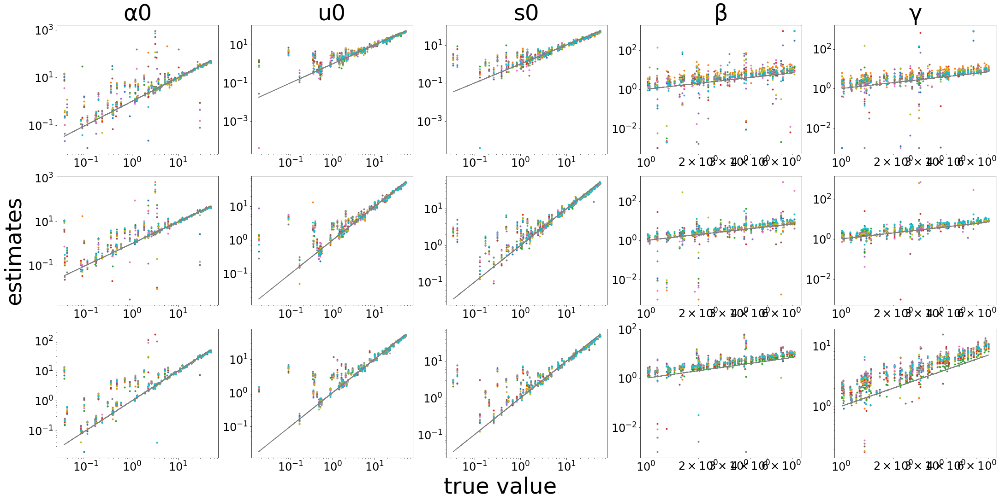

In [110]:
fig = plot_theta_results(results_dir+'topo_1_vary_n_1_linespace.pickle')

100 cells per lineage


100%|██████████| 10/10 [02:08<00:00, 12.88s/it]


316 cells per lineage


100%|██████████| 10/10 [02:07<00:00, 12.75s/it]


1000 cells per lineage


100%|██████████| 10/10 [02:16<00:00, 13.66s/it]


3162 cells per lineage


100%|██████████| 10/10 [02:55<00:00, 17.53s/it]


10000 cells per lineage


100%|██████████| 10/10 [11:30<00:00, 69.02s/it]


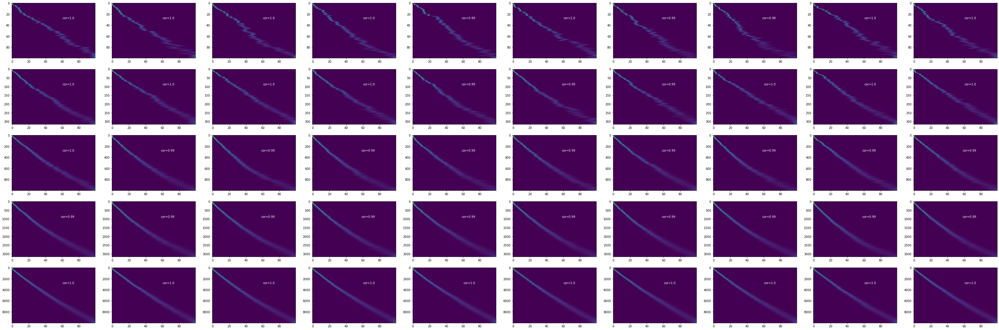

In [27]:
topo = np.array([[0,]])
tau = (0,1)
results = fit_vary_n_fixed(topo, tau, ns=[100,316,1000,3162,10000], p=100, seed=2022, K=10, epoch=10, n_init=3, m=100)

with open(results_dir+'topo_1_vary_n_1.pickle', 'wb') as f:
    pickle.dump(results, f, pickle.HIGHEST_PROTOCOL)

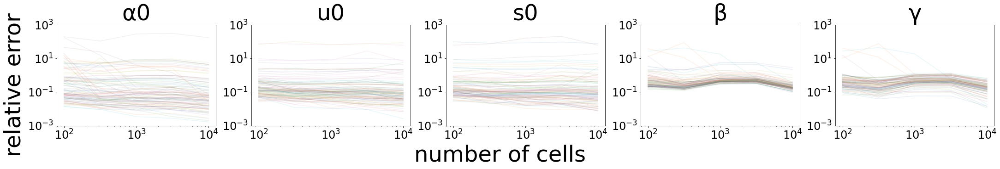

In [115]:
fig = plot_vary_n_results(results_dir+'topo_1_vary_n_1.pickle')

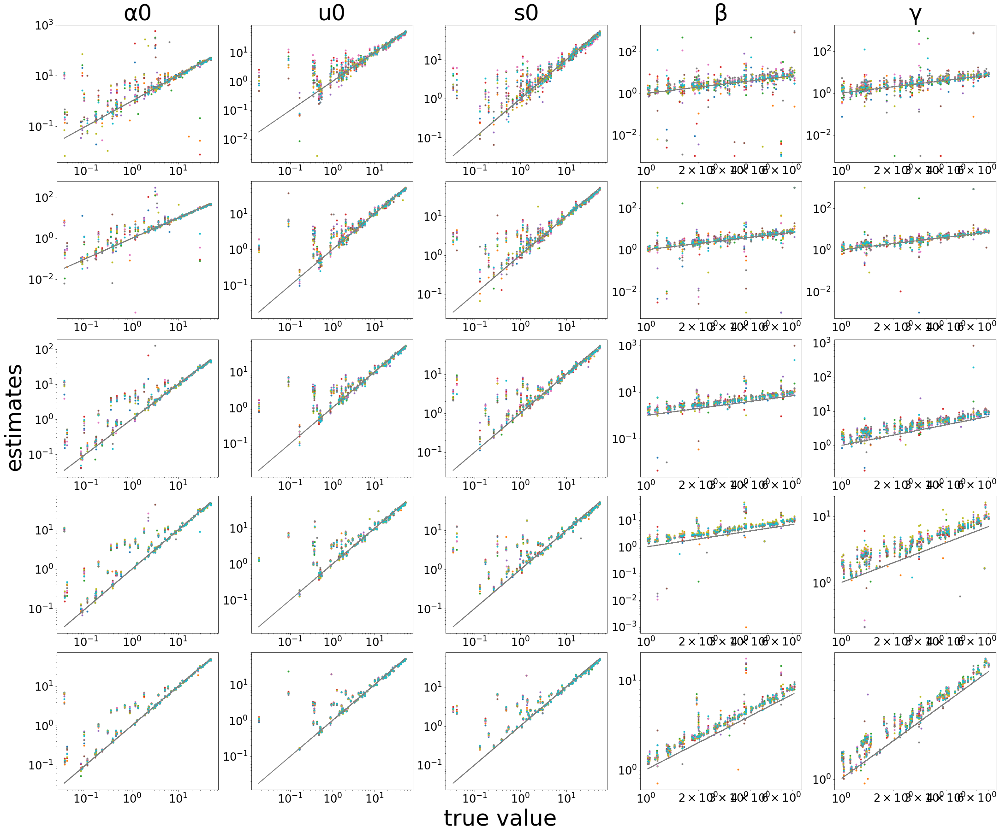

In [106]:
fig = plot_theta_results(results_dir+'topo_1_vary_n_1.pickle')

### Vary p

10 genes


100%|██████████| 10/10 [03:04<00:00, 18.46s/it]


31 genes


100%|██████████| 10/10 [03:30<00:00, 21.07s/it]


100 genes


100%|██████████| 10/10 [04:33<00:00, 27.31s/it]


316 genes


100%|██████████| 10/10 [07:57<00:00, 47.75s/it]


1000 genes


100%|██████████| 10/10 [16:17<00:00, 97.77s/it]


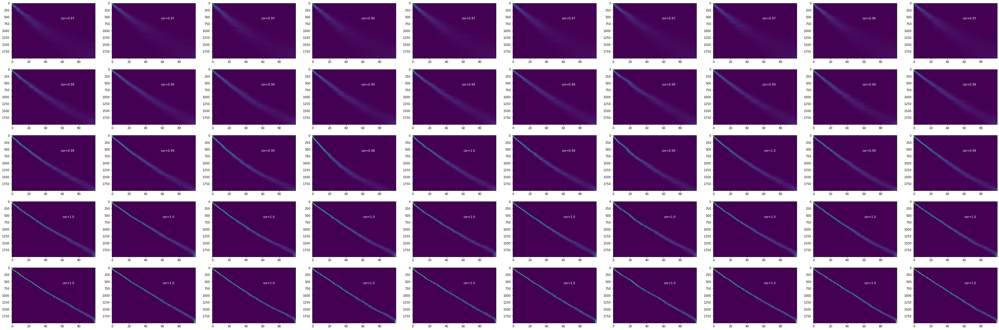

In [34]:
topo = np.array([[0,]])
tau = (0,1)
results = fit_vary_p_fixed(topo, tau, n=2000, ps=[10,31,100,316,1000], seed=2022, K=10, n_init=3, m=100, cores=10)

with open(results_dir+'topo_1_vary_p_1.pickle', 'wb') as f:
    pickle.dump(results, f, pickle.HIGHEST_PROTOCOL)

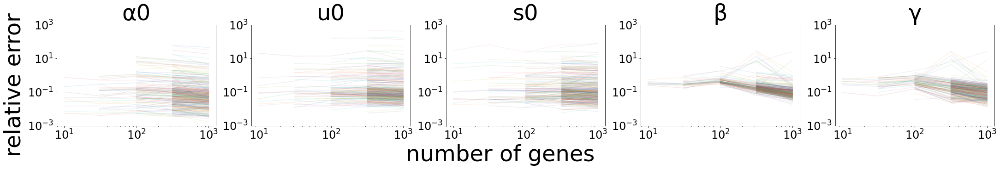

In [116]:
fig = plot_vary_p_results(results_dir+'topo_1_vary_p_1.pickle')

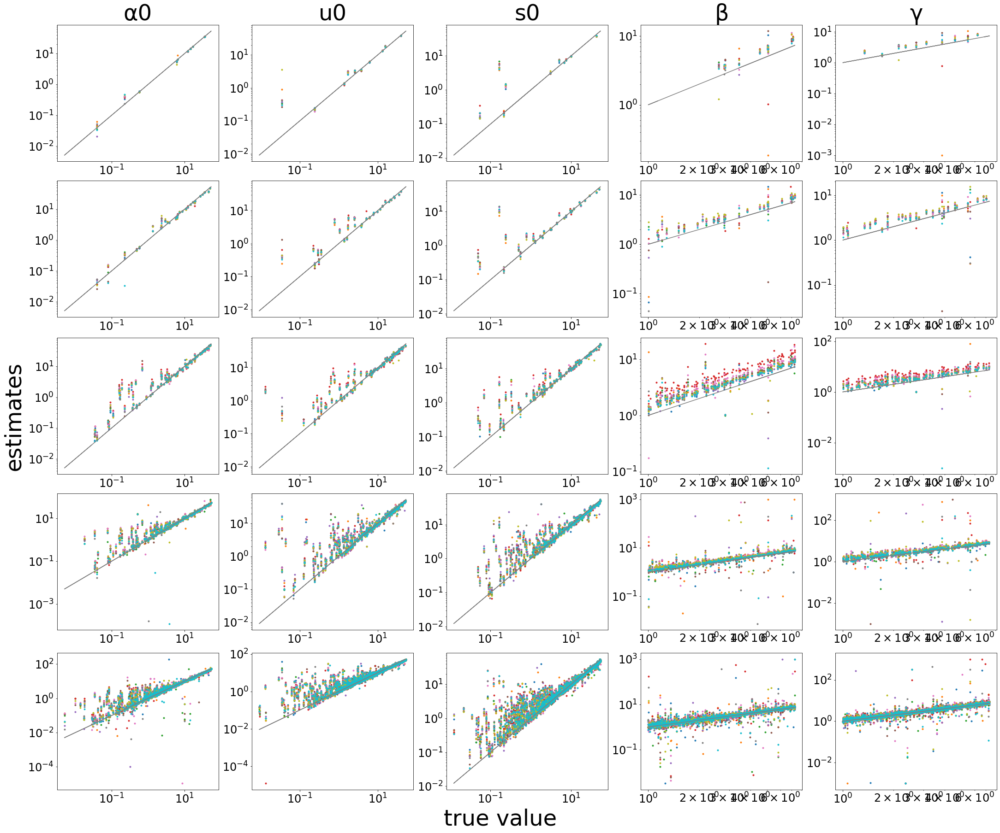

In [107]:
fig = plot_theta_results(results_dir+'topo_1_vary_p_1.pickle')

### Vary null gene numbers

In [ ]:
topo = np.array([[0,]])
tau = (0,1)
results = fit_vary_null_p_single(topo, tau)

In [ ]:
with open('../figures/topo_1_vary_null_p_1.pickle', 'wb') as f:
    pickle.dump(results, f, pickle.HIGHEST_PROTOCOL)

In [74]:
with open('../figures/topo_1_vary_null_p_1.pickle', 'rb') as f:
    results = pickle.load(f)

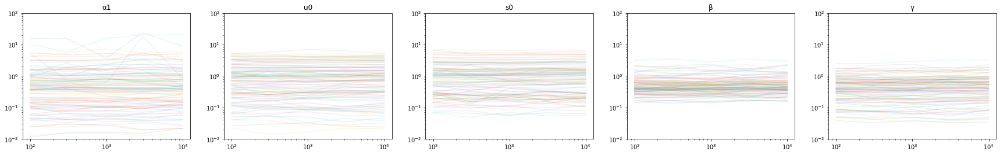

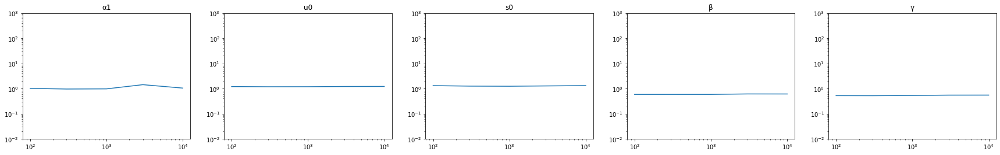

In [78]:
K = 20
p = 100
rho = np.zeros((5,K,p,5))

for i in range(len(results)):
    traj = results[i]
    true_theta = traj.true_theta[:p]
    X = traj.X
    Q = traj.Q
    #rho.append(np.linalg.norm(traj.theta[:true_p]-true_theta[:true_p],axis=0)/np.linalg.norm(true_theta[:true_p],axis=0))
    rho[i//K,i%K]=np.abs(traj.theta[:p]-true_theta[:p])

    
fig, ax = plt.subplots(1,5,figsize=(5*6,4))
for i in range(p):
    for j in range(5):
        ax[j].loglog(ns,rho[:,:,i,j].mean(axis=1),alpha=0.1);

ax[0].set_title("α1")
ax[1].set_title("u0")
ax[2].set_title("s0")
ax[3].set_title("β")
ax[4].set_title("γ")
plt.setp(ax, ylim=(0.01,100));
#plt.savefig("../figures/topo_1_vary_null_p.png")

fig, ax = plt.subplots(1,5,figsize=(5*6,4))
for j in range(5):
    ax[j].loglog(ns,rho[:,:,:,j].mean(axis=(1,2)));
            
ax[0].set_title("α1")
ax[1].set_title("u0")
ax[2].set_title("s0")
ax[3].set_title("β")
ax[4].set_title("γ")
plt.setp(ax, ylim=(0.01,1000));

## Topo 2: one lineage with two transitions

### vary n

100 cells per lineage


100%|██████████| 10/10 [21:00<00:00, 126.02s/it]


316 cells per lineage


100%|██████████| 10/10 [21:33<00:00, 129.34s/it]


1000 cells per lineage


100%|██████████| 10/10 [10:53<00:00, 65.37s/it]


3162 cells per lineage


100%|██████████| 10/10 [12:32<00:00, 75.22s/it]


10000 cells per lineage


100%|██████████| 10/10 [33:17<00:00, 199.71s/it]


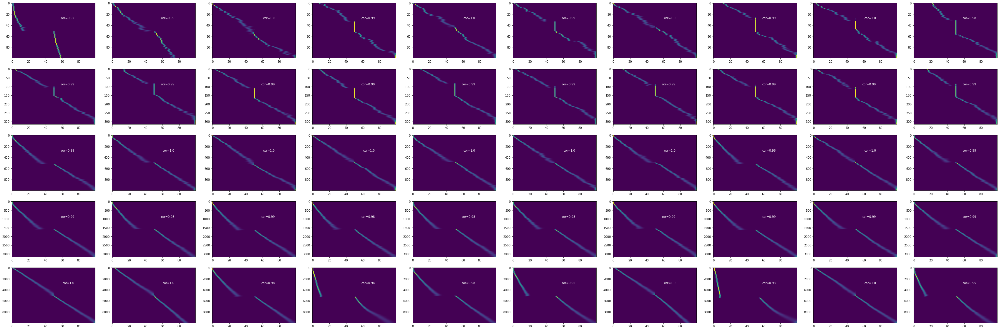

In [28]:
topo = np.array([[0,1]])
tau = (0,1,2)
results = fit_vary_n_fixed(topo, tau, ns=[100,316,1000,3162,10000], p=100, seed=2022, K=10, n_init=3, m=100)

with open(results_dir+'topo_2_vary_n_1.pickle', 'wb') as f:
    pickle.dump(results, f, pickle.HIGHEST_PROTOCOL)

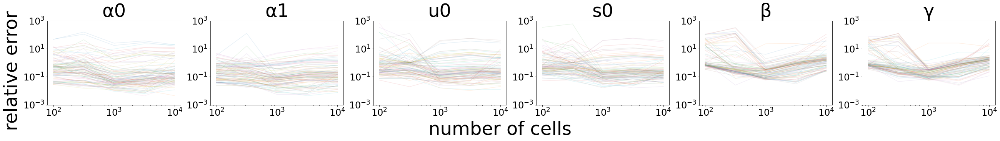

In [117]:
fig = plot_vary_n_results(results_dir+'topo_2_vary_n_1.pickle')

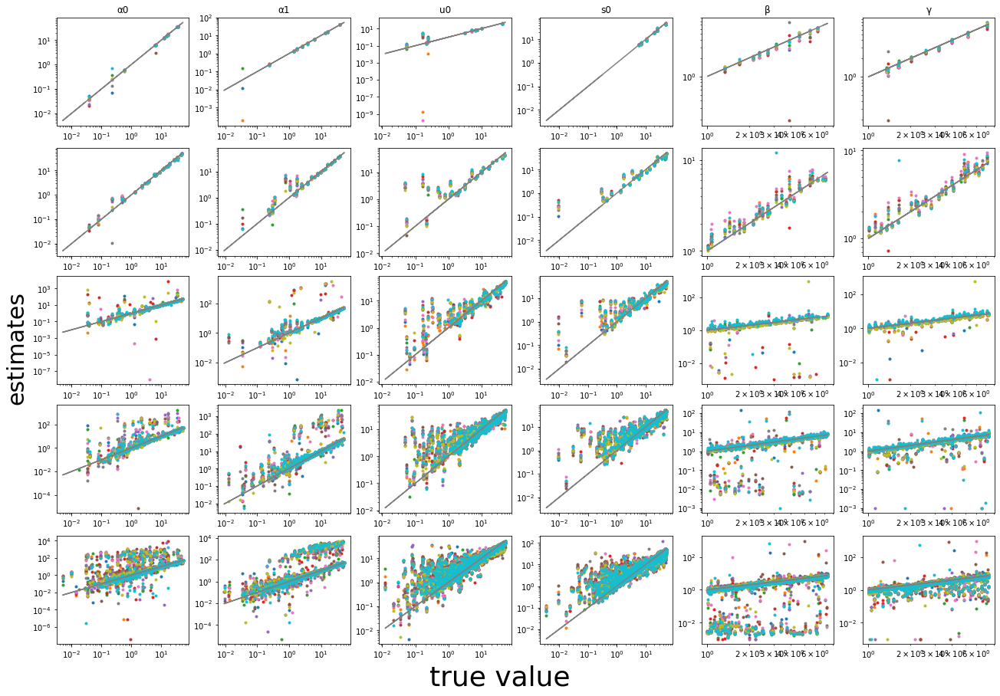

In [66]:
fig = plot_theta_results(results_dir+'topo_2_vary_p_1.pickle')

100 cells per lineage


100%|██████████| 10/10 [08:02<00:00, 48.21s/it]


316 cells per lineage


100%|██████████| 10/10 [08:01<00:00, 48.20s/it]


562 cells per lineage


100%|██████████| 10/10 [08:02<00:00, 48.28s/it]


1000 cells per lineage


100%|██████████| 10/10 [08:31<00:00, 51.15s/it]


1778 cells per lineage


100%|██████████| 10/10 [09:02<00:00, 54.24s/it]


3162 cells per lineage


100%|██████████| 10/10 [10:35<00:00, 63.57s/it]


10000 cells per lineage


100%|██████████| 10/10 [26:27<00:00, 158.78s/it]


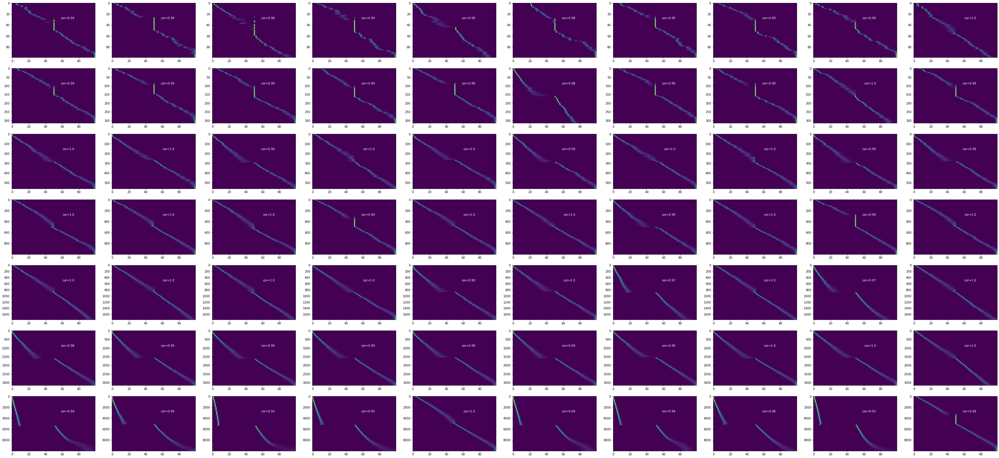

In [15]:
topo = np.array([[0,1]])
tau = (0,1,2)
results = fit_vary_n_fixed(topo, tau, ns=[100,316,562,1000,1778,3162,10000], p=100, seed=2023, K=10, n_init=3, m=100)

with open(results_dir+'topo_2_vary_n_2.pickle', 'wb') as f:
    pickle.dump(results, f, pickle.HIGHEST_PROTOCOL)

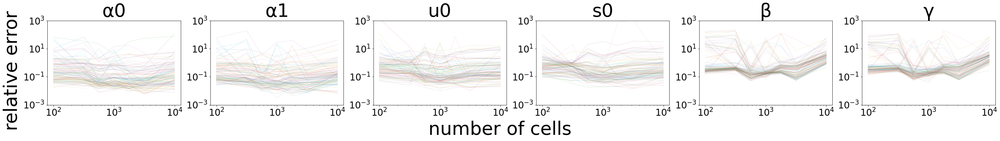

In [121]:
fig = plot_vary_n_results(results_dir+'topo_2_vary_n_2.pickle',ns=[100,316,562,1000,1778,3162,10000],)

### vary p

10 genes


100%|██████████| 10/10 [09:51<00:00, 59.12s/it]


31 genes


100%|██████████| 10/10 [11:17<00:00, 67.72s/it]


100 genes


100%|██████████| 10/10 [15:46<00:00, 94.68s/it]


316 genes


100%|██████████| 10/10 [28:32<00:00, 171.29s/it]


1000 genes


100%|██████████| 10/10 [1:05:49<00:00, 394.95s/it]


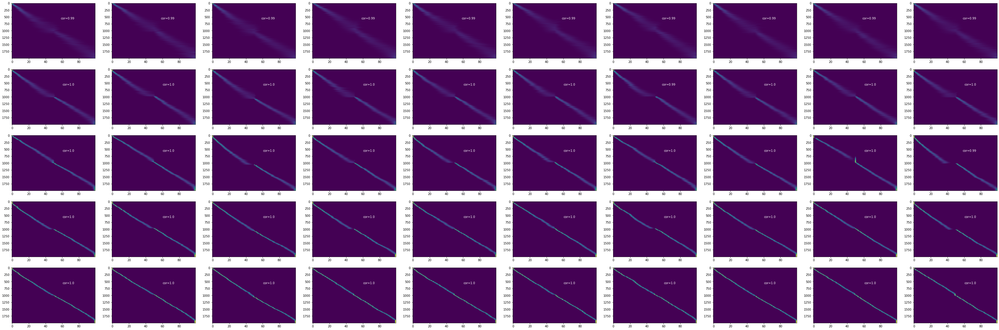

In [35]:
topo = np.array([[0,1]])
tau = (0,1,2)
results = fit_vary_p_fixed(topo, tau, n=2000, ps=[10,31,100,316,1000], seed=2022, K=10, n_init=3, m=100, cores=10)

with open(results_dir+'topo_2_vary_p_1.pickle', 'wb') as f:
    pickle.dump(results, f, pickle.HIGHEST_PROTOCOL)

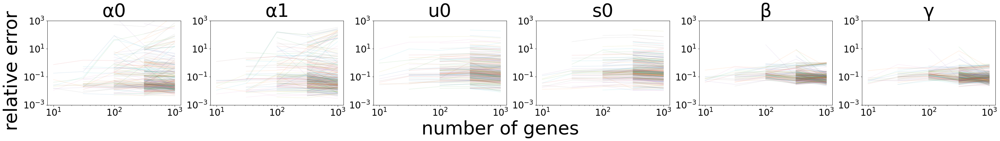

In [118]:
fig = plot_vary_p_results(results_dir+'topo_2_vary_p_1.pickle')

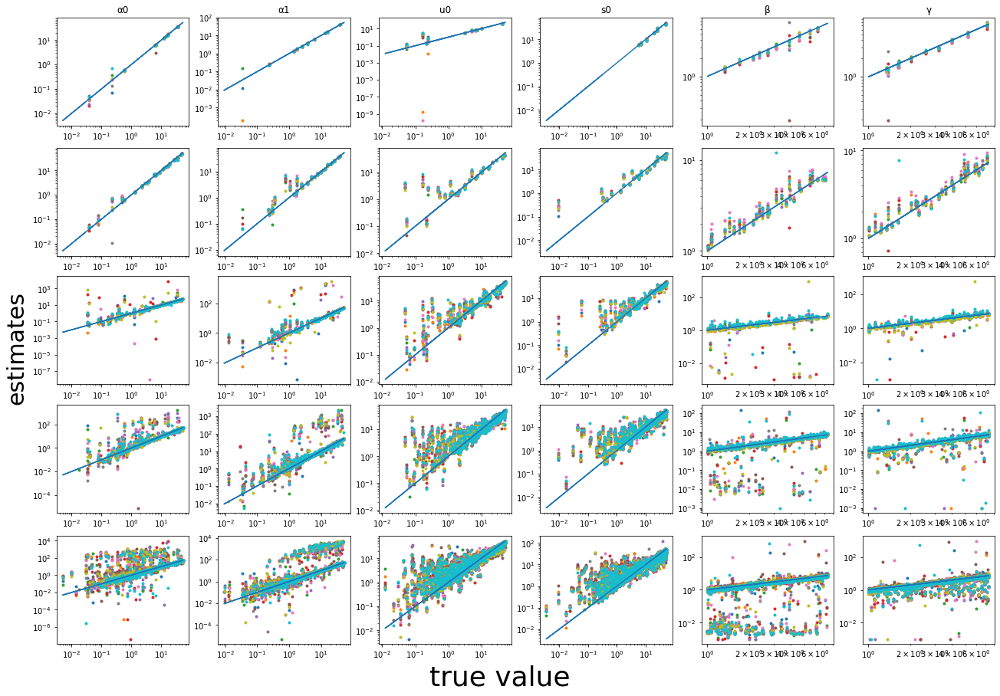

In [62]:
fig = plot_theta_results(results_dir+'topo_2_vary_p_1.pickle')

## Topo 3 : two lineages (bifurcation)

### vary n

100 cells per lineage


100%|██████████| 10/10 [26:39<00:00, 159.90s/it]


316 cells per lineage


100%|██████████| 10/10 [26:23<00:00, 158.38s/it]


1000 cells per lineage


100%|██████████| 10/10 [33:39<00:00, 201.97s/it]


3162 cells per lineage


100%|██████████| 10/10 [55:22<00:00, 332.21s/it] 


10000 cells per lineage


100%|██████████| 10/10 [2:57:39<00:00, 1065.92s/it] 


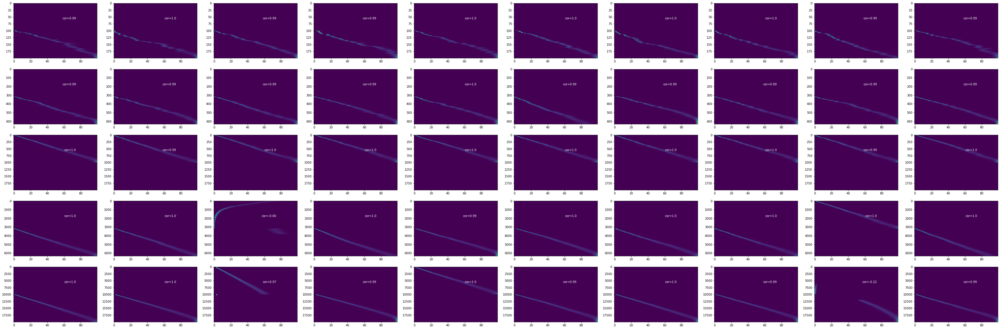

In [29]:
topo = np.array([[0],[1]])
tau = (0,1)
results = fit_vary_n_fixed(topo, tau, ns=[100,316,1000,3162,10000], p=100, seed=2022, K=10, n_init=10, m=100)

with open(results_dir+'topo_3_vary_n_1.pickle', 'wb') as f:
    pickle.dump(results, f, pickle.HIGHEST_PROTOCOL)

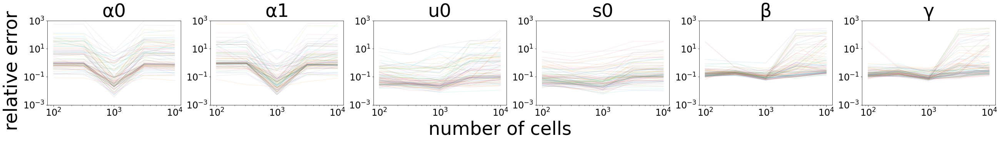

In [119]:
fig = plot_vary_n_results(results_dir+'topo_3_vary_n_1.pickle')

100 cells per lineage


100%|██████████| 10/10 [20:42<00:00, 124.29s/it]


316 cells per lineage


100%|██████████| 10/10 [21:47<00:00, 130.73s/it]


562 cells per lineage


100%|██████████| 10/10 [23:07<00:00, 138.74s/it]


1000 cells per lineage


100%|██████████| 10/10 [24:54<00:00, 149.42s/it]


1778 cells per lineage


100%|██████████| 10/10 [30:44<00:00, 184.44s/it]


3162 cells per lineage


100%|██████████| 10/10 [42:28<00:00, 254.88s/it]


10000 cells per lineage


100%|██████████| 10/10 [2:16:39<00:00, 819.91s/it] 


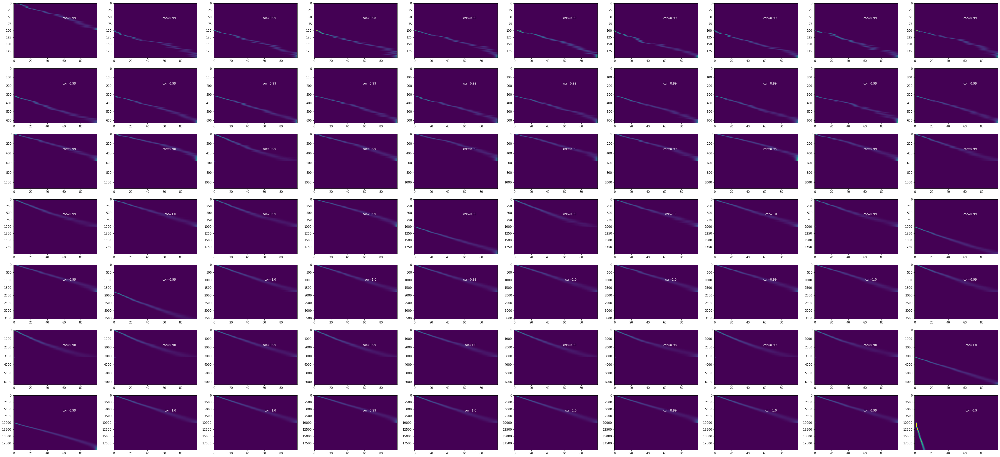

In [16]:
topo = np.array([[0],[1]])
tau = (0,1)
results = fit_vary_n_fixed(topo, tau, ns=[100,316,562,1000,1778,3162,10000], p=100, seed=2023, K=10, n_init=10, m=100)

with open(results_dir+'topo_3_vary_n_2.pickle', 'wb') as f:
    pickle.dump(results, f, pickle.HIGHEST_PROTOCOL)

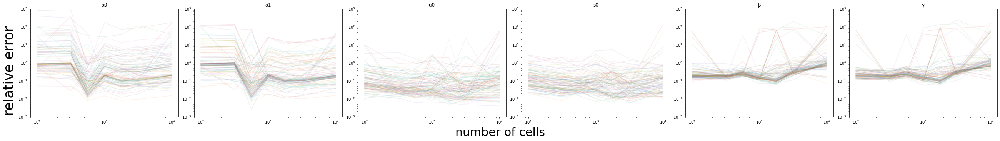

In [26]:
fig = plot_vary_n_results(results_dir+'topo_3_vary_n_2.pickle', ns=[100,316,562,1000,1778,3162,10000])

### Vary p

10 genes


100%|██████████| 10/10 [06:12<00:00, 37.21s/it]


31 genes


100%|██████████| 10/10 [09:43<00:00, 58.34s/it]


100 genes


100%|██████████| 10/10 [11:52<00:00, 71.20s/it]


316 genes


100%|██████████| 10/10 [20:13<00:00, 121.32s/it]


1000 genes


100%|██████████| 10/10 [1:03:02<00:00, 378.21s/it]


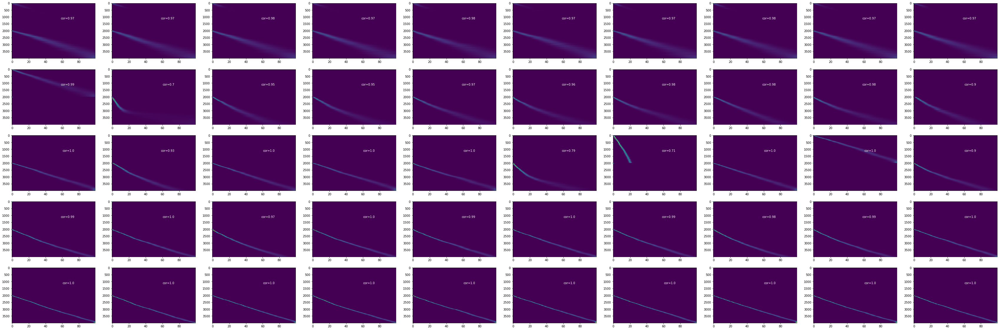

In [36]:
topo = np.array([[0],[1]])
tau = (0,1)
results = fit_vary_p_fixed(topo, tau, n=2000, ps=[10,31,100,316,1000], seed=2022, K=10, n_init=3, m=100, cores=10)

with open(results_dir+'topo_3_vary_p_1.pickle', 'wb') as f:
    pickle.dump(results, f, pickle.HIGHEST_PROTOCOL)

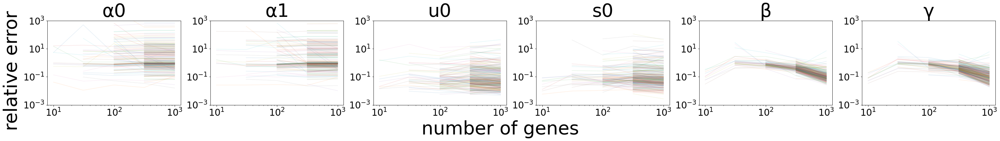

In [120]:
fig = plot_vary_p_results(results_dir+'topo_3_vary_p_1.pickle')

# Model selection

## null genes

In [18]:
import numpy as np

def simulate_data_with_null(topo, tau, n, p, null = 0.5, loga_max=4, logb_max=2, random_seed=42):
    np.random.seed(random_seed)
    L=len(topo)
    n_states=len(set(topo.flatten()))
    t=np.linspace(tau[0],tau[-1],n)
    true_t = []
    
    theta=np.zeros((p,n_states+4))
    for j in range(n_states+2):
        theta[:,j]=np.exp(np.random.uniform(0,loga_max,size=p))-1
    theta[:,-2]=np.exp(np.random.uniform(0,logb_max,size=p))
    theta[:,-1]=np.exp(np.random.uniform(0,logb_max,size=p))

    null_p = int(p*null)
    theta[:null_p,1]=theta[:null_p,0]
    theta[:null_p,-4]=theta[:null_p,0]
    theta[:null_p,-2]=1
    theta[:null_p,-1]=theta[:null_p,-4]/theta[:null_p,-3]

    Y = np.zeros((n*L,p,2))
    for l in range(L):
        theta_l = np.concatenate((theta[:,topo[l]], theta[:,-4:]), axis=1)
        Y[l*n:(l+1)*n] = get_Y(theta_l,t,tau) # m*p*2
        true_t = np.append(true_t,t)

    X = np.random.poisson(Y)
    return theta, true_t, Y, X

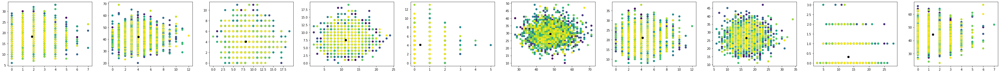

In [21]:
#%% generate data
topo = np.array([[0]])
tau = (0,1)
true_theta, t, Y, X = simulate_data_with_null(topo,tau,n=2000,p=200,random_seed=2023)

t = np.linspace(0,1,2000)
plot_p = 10
fig, ax = plt.subplots(1,plot_p,figsize=(6*plot_p,4))
for i in range(plot_p):
    j = 90 + i
    ax[i].scatter(X[:,j,0],X[:,j,1],c=t);
    ax[i].scatter(Y[:,j,0],Y[:,j,1],c='black');


In [20]:
traj = Trajectory(topo, tau)
res = traj.fit_multi_init(X,100,n_init=2,epoch=10,parallel=True,n_threads=2)

trial 1


100%|██████████| 10/10 [00:20<00:00,  2.08s/it]

trial 2



100%|██████████| 10/10 [00:17<00:00,  1.73s/it]


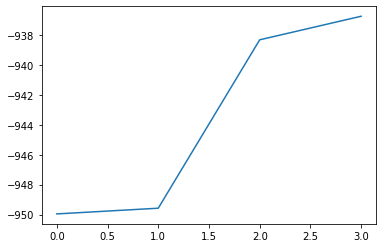

In [22]:
Q, elbos = res
plt.plot(elbos);

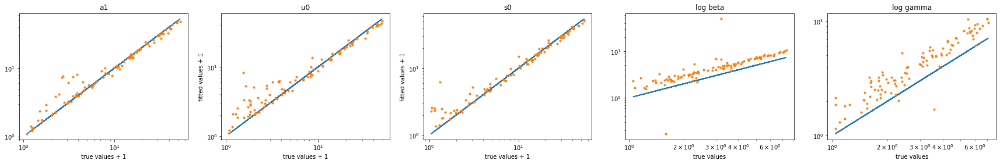

In [23]:
plot_theta(true_theta[100:],traj.theta[100:])

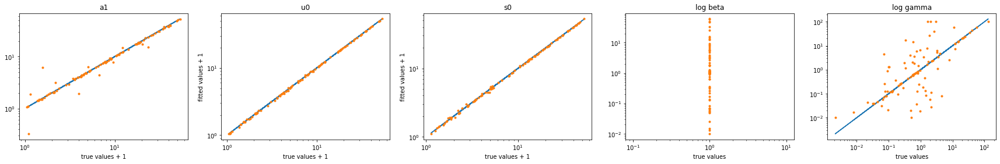

In [24]:
plot_theta(true_theta[:100],traj.theta[:100])

In [ ]:
plot_phase(X,traj.theta[:20],Q,topo,tau)

In [25]:
accepts = []
diffs = []
true_positive = 0
for j in range(100):
    nested_model = {j:[[0,-3],[-4,-4]]}
    accept, diff = traj.compare_model(X, nested_model)
    true_positive += accept
    accepts.append(accept)
    diffs.append(diff)


In [28]:
accepts = []
diffs = []
false_positive = 0
for j in range(100,200):
    nested_model = {j:[[0,-3],[-4,-4]]}
    accept, diff = traj.compare_model(X, nested_model)
    false_positive += accept
    accepts.append(accept)
    diffs.append(diff)


In [29]:
true_positive,false_positive

(95, 0)

## Partially changing genes

In [ ]:
import numpy as np

def simulate_data_with_partial_null(topo, tau, n, p, null_p = 10, loga_max=4, logb_max=2, random_seed=42):
    np.random.seed(random_seed)
    L=len(topo)
    n_states=len(set(topo.flatten()))
    assert n_states > 1
    t=np.linspace(tau[0],tau[-1],n)
    true_t = []
    
    theta=np.zeros((p,n_states+4))
    for j in range(n_states+2):
        theta[:,j]=np.exp(np.random.uniform(0,loga_max,size=p))-1
    theta[:,-2]=np.exp(np.random.uniform(0,logb_max,size=p))
    theta[:,-1]=np.exp(np.random.uniform(0,logb_max,size=p))

    theta[:null_p,1]=theta[:null_p,0]

    Y = np.zeros((n*L,p,2))
    for l in range(L):
        theta_l = np.concatenate((theta[:,topo[l]], theta[:,-4:]), axis=1)
        Y[l*n:(l+1)*n] = get_Y(theta_l,t,tau) # m*p*2
        true_t = np.append(true_t,t)

    X = np.random.poisson(Y)
    return theta, true_t, Y, X

In [ ]:
#%% generate data
topo = np.array([[0,1]])
tau = (0,0.5,1)
true_theta, t, Y, X = simulate_data_with_partial_null(topo,tau,n=2000,p=100,random_seed=2023)

p = 20
fig, ax = plt.subplots(1,p,figsize=(6*p,4))
for i in range(p):
    ax[i].set_title(str(i));
    ax[i].scatter(X[:,i,0],X[:,i,1],c=t);
    ax[i].scatter(Y[:,i,0],Y[:,i,1],c='black');
# time increases from blue to yellow

In [ ]:
traj = Trajectory(topo, tau)
res = traj.fit_multi_init(X,100,n_init=10,epoch=10,parallel=True,n_threads=2)

In [ ]:
Q, elbos, thetas = res
plt.plot(elbos);

In [ ]:
plot_theta(true_theta[10:],traj.theta[10:])

In [ ]:
plot_phase(X,traj.theta[:20],Q,topo,tau)

In [ ]:
accepts = []
diffs = []
for j in range(20):
    nested_model = {j:[[1],[0]]}
    accept, diff = traj.compare_model(X, nested_model, parallel=True, n_threads=2)
    accepts.append(accept)
    diffs.append(diff)

In [ ]:
plt.plot(accepts);

In [ ]:
plot_phase(X,traj.new_theta[:20],Q,topo,tau)

In [ ]:
plt.plot(diffs)